In [1]:
from sklearn.preprocessing import StandardScaler
from visualization_fct import *

import itertools
from bokeh.io import output_notebook
output_notebook()
from bokeh.plotting import show  # output_file, save


from pomegranate import HiddenMarkovModel
from pomegranate import MultivariateGaussianDistribution
from pomegranate import State, Distribution

import matplotlib.pyplot as plt  # , mpld3

data = pd.read_csv("../asm_data/asm_data_for_ml.txt", sep='\t')
del data['MJD']
del data['error']
del data['errorA']
del data['errorB']
del data['errorC']
data['rateCA'] = data.rateC / data.rateA
data_thr = mask(data, 'orbit')  # rm too large values except for 'orbit'


np.random.seed(0)

X = np.c_[data_thr.orbit, data_thr.rate, data_thr.rateA, data_thr.rateB,
          data_thr.rateC, data_thr.rateCA]

scaler = StandardScaler()
X = scaler.fit_transform(X)


X_1 = X[2000:3000]
X_11 = X[3000:4000]
X_111 = X[4000:4500]

X_2 = X[400:500]
X_22 = X[500:600]
X_222 = X[600:800]

X_3 = X[7000:7300]
X_33 = X[7300:7600]
X_333 = X[7600:8000]

X_4 = X[np.random.randint(0,X.shape[0], 100)]
X_44 = X[np.random.randint(0,X.shape[0], 100)]
X_444 = X[np.random.randint(0,X.shape[0], 100)]

a = MultivariateGaussianDistribution.from_samples(X_1)
aa = MultivariateGaussianDistribution.from_samples(X_11)
aaa = MultivariateGaussianDistribution.from_samples(X_111)

b = MultivariateGaussianDistribution.from_samples(X_2)
bb = MultivariateGaussianDistribution.from_samples(X_22)
bbb = MultivariateGaussianDistribution.from_samples(X_222)

c = MultivariateGaussianDistribution.from_samples(X_3)
cc = MultivariateGaussianDistribution.from_samples(X_33)
ccc = MultivariateGaussianDistribution.from_samples(X_333)

d = MultivariateGaussianDistribution.from_samples(X_4)
dd = MultivariateGaussianDistribution.from_samples(X_44)
ddd = MultivariateGaussianDistribution.from_samples(X_444)


s1 = State(a, name="M1")
s11 = State(aa, name="M11")
s111 = State(aaa, name="M111")

s2 = State(b, name="M2")
s22 = State(bb, name="M22")
s222 = State(bbb, name="M222")

s3 = State(c, name="M3")
s33 = State(cc, name="M33")
s333 = State(ccc, name="M333")

s4 = State(c, name="M4")
s44 = State(cc, name="M44")
s444 = State(ccc, name="M444")

hmm = HiddenMarkovModel()
hmm.add_states(s1, s11, s111, s2, s22, s222, s3, s33, s333, s4, s44, s444)

hmm.add_transition(hmm.start, s1, 0.12)
hmm.add_transition(hmm.start, s11, 0.08)
hmm.add_transition(hmm.start, s111, 0.08)
hmm.add_transition(hmm.start, s2, 0.08)
hmm.add_transition(hmm.start, s22, 0.08)
hmm.add_transition(hmm.start, s222, 0.08)
hmm.add_transition(hmm.start, s3, 0.08)
hmm.add_transition(hmm.start, s33, 0.08)
hmm.add_transition(hmm.start, s333, 0.08)
hmm.add_transition(hmm.start, s4, 0.08)
hmm.add_transition(hmm.start, s44, 0.08)
hmm.add_transition(hmm.start, s444, 0.08)


hmm.add_transition(s1, s1, 0.89)
hmm.add_transition(s1, s11, 0.01)
hmm.add_transition(s1, s111, 0.01)
hmm.add_transition(s1, s2, 0.01)
hmm.add_transition(s1, s22, 0.01)
hmm.add_transition(s1, s222, 0.01)
hmm.add_transition(s1, s3, 0.01)
hmm.add_transition(s1, s33, 0.01)
hmm.add_transition(s1, s333, 0.01)
hmm.add_transition(s1, s4, 0.01)
hmm.add_transition(s1, s44, 0.01)
hmm.add_transition(s1, s444, 0.01)


hmm.add_transition(s11, s1, 0.01)
hmm.add_transition(s11, s11, 0.89)
hmm.add_transition(s11, s111, 0.01)
hmm.add_transition(s11, s2, 0.01)
hmm.add_transition(s11, s22, 0.01)
hmm.add_transition(s11, s222, 0.01)
hmm.add_transition(s11, s3, 0.01)
hmm.add_transition(s11, s33, 0.01)
hmm.add_transition(s11, s333, 0.01)
hmm.add_transition(s11, s4, 0.01)
hmm.add_transition(s11, s44, 0.01)
hmm.add_transition(s11, s444, 0.01)

hmm.add_transition(s111, s1, 0.01)
hmm.add_transition(s111, s11, 0.01)
hmm.add_transition(s111, s111, 0.89)
hmm.add_transition(s111, s2, 0.01)
hmm.add_transition(s111, s22, 0.01)
hmm.add_transition(s111, s222, 0.01)
hmm.add_transition(s111, s3, 0.01)
hmm.add_transition(s111, s33, 0.01)
hmm.add_transition(s111, s333, 0.01)
hmm.add_transition(s111, s4, 0.01)
hmm.add_transition(s111, s44, 0.01)
hmm.add_transition(s111, s444, 0.01)

hmm.add_transition(s2, s1, 0.01)
hmm.add_transition(s2, s11, 0.01)
hmm.add_transition(s2, s111, 0.01)
hmm.add_transition(s2, s2, 0.89)
hmm.add_transition(s2, s22, 0.01)
hmm.add_transition(s2, s222, 0.01)
hmm.add_transition(s2, s3, 0.01)
hmm.add_transition(s2, s33, 0.01)
hmm.add_transition(s2, s333, 0.01)
hmm.add_transition(s2, s4, 0.01)
hmm.add_transition(s2, s44, 0.01)
hmm.add_transition(s2, s444, 0.01)

hmm.add_transition(s22, s1, 0.01)
hmm.add_transition(s22, s11, 0.01)
hmm.add_transition(s22, s111, 0.01)
hmm.add_transition(s22, s2, 0.01)
hmm.add_transition(s22, s22, 0.89)
hmm.add_transition(s22, s222, 0.01)
hmm.add_transition(s22, s3, 0.01)
hmm.add_transition(s22, s33, 0.01)
hmm.add_transition(s22, s333, 0.01)
hmm.add_transition(s22, s4, 0.01)
hmm.add_transition(s22, s44, 0.01)
hmm.add_transition(s22, s444, 0.01)

hmm.add_transition(s222, s1, 0.01)
hmm.add_transition(s222, s11, 0.01)
hmm.add_transition(s222, s111, 0.01)
hmm.add_transition(s222, s2, 0.01)
hmm.add_transition(s222, s22, 0.01)
hmm.add_transition(s222, s222, 0.89)
hmm.add_transition(s222, s3, 0.01)
hmm.add_transition(s222, s33, 0.01)
hmm.add_transition(s222, s333, 0.01)
hmm.add_transition(s222, s4, 0.01)
hmm.add_transition(s222, s44, 0.01)
hmm.add_transition(s222, s444, 0.01)


hmm.add_transition(s3, s1, 0.01)
hmm.add_transition(s3, s11, 0.01)
hmm.add_transition(s3, s111, 0.01)
hmm.add_transition(s3, s2, 0.01)
hmm.add_transition(s3, s22, 0.01)
hmm.add_transition(s3, s222, 0.01)
hmm.add_transition(s3, s3, 0.89)
hmm.add_transition(s3, s33, 0.01)
hmm.add_transition(s3, s333, 0.01)
hmm.add_transition(s3, s4, 0.01)
hmm.add_transition(s3, s44, 0.01)
hmm.add_transition(s3, s444, 0.01)

hmm.add_transition(s33, s1, 0.01)
hmm.add_transition(s33, s11, 0.01)
hmm.add_transition(s33, s111, 0.01)
hmm.add_transition(s33, s2, 0.01)
hmm.add_transition(s33, s22, 0.01)
hmm.add_transition(s33, s222, 0.01)
hmm.add_transition(s33, s3, 0.01)
hmm.add_transition(s33, s33, 0.89)
hmm.add_transition(s33, s333, 0.01)
hmm.add_transition(s33, s4, 0.01)
hmm.add_transition(s33, s44, 0.01)
hmm.add_transition(s33, s444, 0.01)

hmm.add_transition(s333, s1, 0.01)
hmm.add_transition(s333, s11, 0.01)
hmm.add_transition(s333, s111, 0.01)
hmm.add_transition(s333, s2, 0.01)
hmm.add_transition(s333, s22, 0.01)
hmm.add_transition(s333, s222, 0.01)
hmm.add_transition(s333, s3, 0.01)
hmm.add_transition(s333, s33, 0.01)
hmm.add_transition(s333, s333, 0.89)
hmm.add_transition(s333, s4, 0.01)
hmm.add_transition(s333, s44, 0.01)
hmm.add_transition(s333, s444, 0.01)

hmm.add_transition(s4, s1, 0.01)
hmm.add_transition(s4, s11, 0.01)
hmm.add_transition(s4, s111, 0.01)
hmm.add_transition(s4, s2, 0.01)
hmm.add_transition(s4, s22, 0.01)
hmm.add_transition(s4, s222, 0.01)
hmm.add_transition(s4, s3, 0.01)
hmm.add_transition(s4, s33, 0.01)
hmm.add_transition(s4, s333, 0.01)
hmm.add_transition(s4, s4, 0.89)
hmm.add_transition(s4, s44, 0.01)
hmm.add_transition(s4, s444, 0.01)

hmm.add_transition(s44, s1, 0.01)
hmm.add_transition(s44, s11, 0.01)
hmm.add_transition(s44, s111, 0.01)
hmm.add_transition(s44, s2, 0.01)
hmm.add_transition(s44, s22, 0.01)
hmm.add_transition(s44, s222, 0.01)
hmm.add_transition(s44, s3, 0.01)
hmm.add_transition(s44, s33, 0.01)
hmm.add_transition(s44, s333, 0.01)
hmm.add_transition(s44, s4, 0.01)
hmm.add_transition(s44, s44, 0.89)
hmm.add_transition(s44, s444, 0.01)

hmm.add_transition(s444, s1, 0.01)
hmm.add_transition(s444, s11, 0.01)
hmm.add_transition(s444, s111, 0.01)
hmm.add_transition(s444, s2, 0.01)
hmm.add_transition(s444, s22, 0.01)
hmm.add_transition(s444, s222, 0.01)
hmm.add_transition(s444, s3, 0.01)
hmm.add_transition(s444, s33, 0.01)
hmm.add_transition(s444, s333, 0.01)
hmm.add_transition(s444, s4, 0.01)
hmm.add_transition(s444, s44, 0.01)
hmm.add_transition(s444, s444, 0.89)

hmm.bake()

Loading BokehJS ...

In [2]:
hmm.fit(X)  # hmm does not support weights in pomegranate
preds = hmm.predict(X)
probs = hmm.predict_proba(X)

data_thr['preds'] = pd.Series(preds).astype("category")

color_key = ["red", "blue", "yellow", "grey", "black", "purple", "pink",
             "brown", "green", "orange"] * 2  # Spectral9
color_key = color_key[:len(set(preds))+2]

covs = np.array([np.array(hmm.states[m].distribution.parameters[1])
                 for m in range(9)])
means = np.array([np.array(hmm.states[m].distribution.parameters[0])
                  for m in range(9)])

# transform cov for non-standardizeed data:
covs = np.array([np.dot(np.diag(np.sqrt(scaler.var_)),
                        np.dot(covs[j], np.diag(np.sqrt(scaler.var_))))
                 for j in range(covs.shape[0])])
means = np.array([scaler.inverse_transform(means[j].reshape(1, -1)).T
                  for j in range(means.shape[0])])

Training improvement: 1402466.34121
Training improvement: 232290.25242
Training improvement: 119561.241852
Training improvement: -1023889.98525
Total Training Improvement: 730427.850239


In [3]:
# single plot rateCA vs rate with predicted classes and ellipses:
x = 5
y = 1
covs_xy = [covs[j][[x, y]][:, [x, y]] for j in range(len(covs))]
means_xy = [means[j][[x, y]] for j in range(len(covs))]

# # #uncommment if log
#for j in range(len(covs)):
#    covs_xy[j][0] = np.exp(covs_xy[j][0]) - 1
#    means_xy[j][0] = np.exp(means_xy[j][0]) - 1

single_plot = bokeh_datashader_plot(data_thr, covs=covs_xy, means=means_xy,
                                    x_name='rateCA',
                                    y_name='rate',
                                    plot_width=900, plot_height=300,
                                    pixel_width=3000, pixel_height=1000,
                                    spread=True, color_key=color_key)
show(single_plot)

<IPython.core.display.Javascript object>


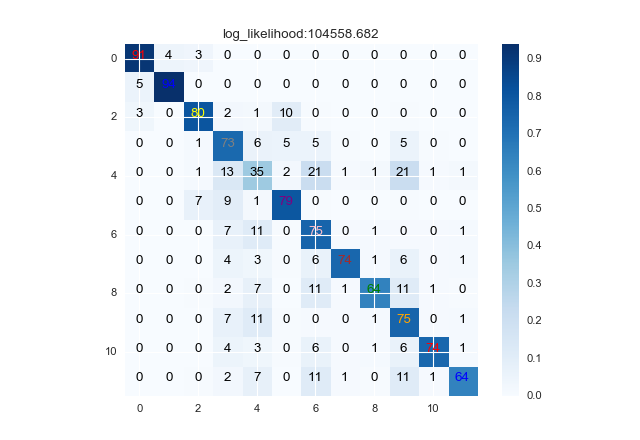

In [71]:
T = np.exp(hmm.dense_transition_matrix())[:12, :12]
%matplotlib notebook
plt.figure()
plt.imshow(T, interpolation='nearest', cmap=plt.cm.Blues)
plt.colorbar()
for i, j in itertools.product(range(T.shape[0]), range(T.shape[1])):
        plt.text(j, i, int(T[i, j]*100),
                 horizontalalignment="center",
                 color = color_key[i] if i==j else color=="white" if T[i, j] > 0.5 else "black")
plt.title('log_likelihood:%0.3f' % hmm.log_probability(X))
#["red", "blue", "yellow", "grey", "black", "purple", "pink", "brown", "green", "orange"]

In [65]:
from sklearn.cluster.bicluster import SpectralCoclustering
biclust = SpectralCoclustering(n_clusters=4)
biclust.fit(T)
print biclust.column_labels_
print biclust.row_labels_
#biclust.biclusters_[0][0, :]

[3 2 1 0 0 1 0 0 0 0 0 0]
[3 2 1 0 0 1 0 0 0 0 0 0]


<IPython.core.display.Javascript object>


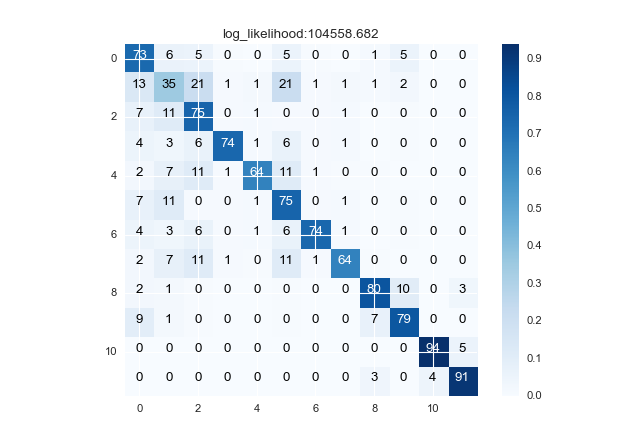

In [66]:
TT = T[np.argsort(biclust.row_labels_)]
TT = TT[:, np.argsort(biclust.column_labels_)]
plt.figure()
plt.imshow(TT, interpolation='nearest', cmap=plt.cm.Blues)
plt.colorbar()
for i, j in itertools.product(range(TT.shape[0]), range(TT.shape[1])):
        plt.text(j, i, int(TT[i, j]*100),
                 horizontalalignment="center",
                 color="white" if TT[i, j] > 0.5 else "black")
plt.title('log_likelihood:%0.3f' % hmm.log_probability(X))


In [68]:
hmm.log_probability(X)

104558.68163017617

<IPython.core.display.Javascript object>


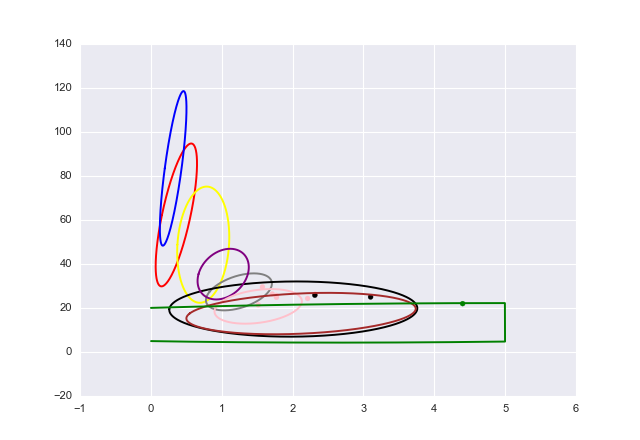

In [99]:
import matplotlib.animation as animation

fig, ax = plt.subplots()

XX = np.c_[data_thr.rateCA, data_thr.rate]
ind = np.array(data_thr.rateCA < 5) * np.array(data_thr.rate < 80)
XX = XX[ind, :]
yy = np.array(preds)[ind]

line = ax.scatter(XX[:, 0], XX[:, 1])

for n_comp in range(len(covs_xy)):
    cov = covs_xy[n_comp]
    mean = means_xy[n_comp]
    v, w = np.linalg.eigh(cov)
    e0 = w[0] / np.linalg.norm(w[0])
    e1 = w[1] / np.linalg.norm(w[1])
    t = np.linspace(0, 2 * np.pi, 10000)
    # 4.605 corresponds to 90% quantile:
    a = (mean[0]
         + np.sqrt(4.605 * v[0]) * np.cos(t) * e0[0]
         + np.sqrt(4.605 * v[1]) * np.sin(t) * e1[0])
    b = (mean[1]
         + np.sqrt(4.605 * v[0]) * np.cos(t) * e0[1]
         + np.sqrt(4.605 * v[1]) * np.sin(t) * e1[1])
    inds = (a<5) * (a>0)
    a = a[inds]
    b = b[inds]

    ax.plot(a, b, color=color_key[n_comp])


def animate(i):
    line.set_offsets(XX[10*i:10*(i+1), :])
    #line.set_xdata(XX[10*i:10*(i+1), 0])  # update the data
    #line.set_ydata(XX[10*i:10*(i+1), 1])   # update the data
    #line.set_color(color_key[preds[1*i]])
    color = [color_key[yy[10*i + k]] for k in range(10)]
    line.set_color(color)
    return line,

ani = animation.FuncAnimation(fig, animate, np.arange(1000, 9300), #init_func=init,
                              interval=1, blit=True)
#plt.show()


<IPython.core.display.Javascript object>


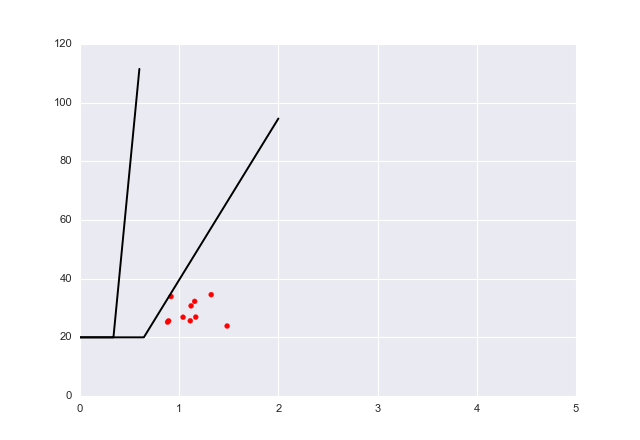

In [116]:
import matplotlib.animation as animation

fig, ax = plt.subplots()
ax.set_xlim(0, 5)
ax.set_ylim(0, 120)

#XX = np.c_[data_thr.rateCA, data_thr.rate]
#ind = np.array(data_thr.rateCA < 5) * np.array(data_thr.rate < 80)
#XX = XX[ind, :]

x = XX[:, 0]
y = XX[:, 1]

upper = np.array(y > np.maximum(20, 350 * (x - 0.28))).astype(bool)
lower = np.array(y < np.maximum(20, 55 * (x - 0.28))).astype(bool)

yy = np.ones(X.shape[0]).astype(int)
yy[lower] = 0
yy[upper] = 2

line = ax.scatter(XX[:, 0], XX[:, 1])

# plot the manual decisions (lines):
t = np.linspace(0, 2, 1000)
y1 = np.max([20 * np.ones(t.shape[0]), 55 * (t - 0.28)], axis=0)
tt = t[:300]
y2 = np.max([20 * np.ones(tt.shape[0]), 350 * (tt - 0.28)], axis=0)
ax.plot(t, y1, color='black')
ax.plot(tt, y2, color='black')


def animate(i):
    line.set_offsets(XX[10*i:10*(i+1), :])
    #line.set_xdata(XX[10*i:10*(i+1), 0])  # update the data
    #line.set_ydata(XX[10*i:10*(i+1), 1])   # update the data
    #line.set_color(color_key[preds[1*i]])
    color = [color_key[yy[10*i + k]] for k in range(10)]
    line.set_color(color)
    return line,

ani = animation.FuncAnimation(fig, animate, np.arange(4000, 4500), #init_func=init,
                              interval=1, blit=True)
#plt.show()
ani.save('streaming_asm.mp4', writer = 'mencoder', fps=30, extra_args=['-vcodec', 'libx264'])

In [102]:
set(yy)

{0, 1, 2}

In [ ]:
# linked brushing:

x = 5
y = 1
covs_xy = [covs[j][[x, y]][:, [x, y]] for j in range(len(covs))]
means_xy = [means[j][[x, y]] for j in range(len(covs))]


data_probs = data_thr.copy()
for j in range(probs.shape[1]):
    data_probs['probs'+str(j)] = pd.Series(probs[:, j])

p = plot_probs_bokeh_linked_brushing(data_probs, color_key=color_key,
                                x_name='rateCA', y_name='rate',
                                covs=covs_xy, means=means_xy)
show(p)

In [ ]:
T = np.exp(hmm.dense_transition_matrix())[:9, :9]

In [ ]:
#["red", "blue", "yellow", "grey", "black", "purple", "pink", "brown", "green", "orange"]

In [ ]:
%matplotlib notebook
plt.matshow(np.log(T+1))

In [ ]:
T[9]

In [ ]:
hmm.states[12]

In [ ]:
T = np.exp(hmm.dense_transition_matrix())[:12, :12]
w, v = np.linalg.eig(T)
ww = np.argsort(-w)
plt.matshow(v[ww,:].T)